# Data Understanding

### Column	Description
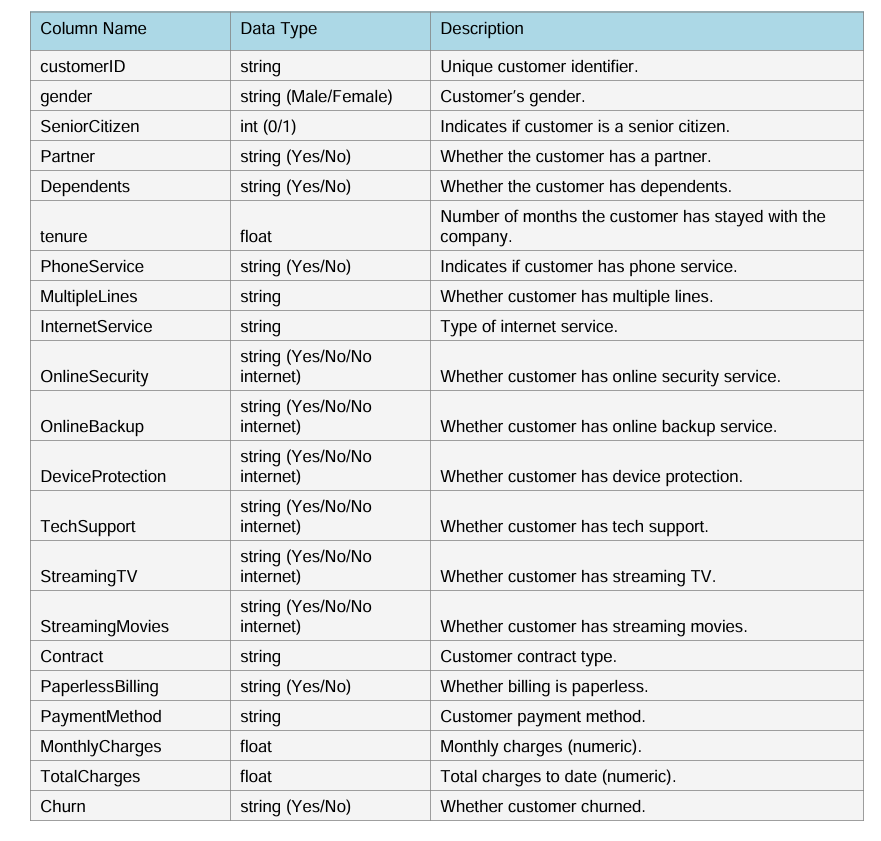

# Data Loading

In [111]:
import numpy as np
import pandas as pd
import plotly.express as px

In [112]:
# Set the maximum number of columns to display
pd.set_option('display.max_columns', None)



In [113]:
df = pd.read_csv("telco_customer_data_v2.csv")
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,CUST00001,Male,0,No,Yes,3.0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,68.61,205.83,Yes
1,CUST00002,Male,1,Yes,No,2.0,Yes,Yes,DSL,No,No,No internet service,Yes,NaN,No,One year,Yes,Bank transfer (automatic),23.15,46.3,No
2,CUST00003,Female,No,No,No,42.0,Yes,Yes,DSL,No,Yes,No,NaN,Yes,Yes,Month-to-month,No,Electronic check,42.63,1790.46,Yes
3,CUST00004,Female,0,No,Yes,40.0,Yes,Yes,Fiber optic,No,No,Yes,No,No,No internet service,Month-to-month,No,Electronic check,75.04,3001.6,No
4,CUST00005,Male,Yes,Yes,Yes,17.0,Yes,NaN,Fiber optic,Yes,No,Yes,No,No internet service,No,Two year,Yes,Electronic check,22.38,380.46,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,CUST69996,Male,1,Yes,Yes,30.0,Yes,Yes,Fiber optic,Yes,Yes,No,Yes,No,No,Two year,No,Electronic check,74.85,2245.5,No
69996,CUST69997,Male,0,Yes,NaN,15.0,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Bank transfer (automatic),40.67,610.05,Yes
69997,CUST69998,Male,0,NaN,No,20.0,Yes,No,DSL,Yes,No,No,No,NaN,No,Month-to-month,Yes,Mailed check,29.44,588.8,No
69998,CUST69999,Male,0,No,No,21.0,Yes,No,Fiber optic,No,Yes,No,No,Yes,No internet service,Month-to-month,Yes,Electronic check,46.77,982.17,No


# Data Exploration 

- Check data types

In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        70000 non-null  object 
 1   gender            69252 non-null  object 
 2   SeniorCitizen     69341 non-null  object 
 3   Partner           66470 non-null  object 
 4   Dependents        66435 non-null  object 
 5   tenure            69433 non-null  float64
 6   PhoneService      70000 non-null  object 
 7   MultipleLines     68132 non-null  object 
 8   InternetService   70000 non-null  object 
 9   OnlineSecurity    67078 non-null  object 
 10  OnlineBackup      67253 non-null  object 
 11  DeviceProtection  67106 non-null  object 
 12  TechSupport       67267 non-null  object 
 13  StreamingTV       67173 non-null  object 
 14  StreamingMovies   67215 non-null  object 
 15  Contract          70000 non-null  object 
 16  PaperlessBilling  70000 non-null  object

- Check Summary Statictics For Numerical Coulmns

In [115]:
df.describe().round(2)

,tenure,MonthlyCharges
count,69433.00,69612.00
mean,30.52,60.59
std,89.87,111.51
min,-10.00,18.00
25%,10.00,29.67
50%,20.00,41.19
75%,35.00,63.88
max,999.00,1499.77


- Check Summary Statictics For categorical Coulmns

In [116]:
# categorical Coulmns only and drop numerical that not object
df.describe(include=['object']).drop('TotalCharges', axis=1)



,customerID,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn
count,70000,69252,69341,66470,66435,70000,68132,70000,67078,67253,67106,67267,67173,67215,70000,70000,66431,70000
unique,70000,7,5,2,2,2,3,3,5,5,5,5,5,5,4,2,5,7
top,CUST00001,Female,0,No,No,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,No
freq,1,34110,52405,38344,45375,63011,34681,38502,39195,39308,39199,39401,39198,39189,41845,42011,27841,37057


- check  duplicates

In [117]:
df.duplicated().sum()

np.int64(0)

- check  Missing values

In [118]:
df.isna().sum()

customerID             0
gender               748
SeniorCitizen        659
Partner             3530
Dependents          3565
tenure               567
PhoneService           0
MultipleLines       1868
InternetService        0
OnlineSecurity      2922
OnlineBackup        2747
DeviceProtection    2894
TechSupport         2733
StreamingTV         2827
StreamingMovies     2785
Contract               0
PaperlessBilling       0
PaymentMethod       3569
MonthlyCharges       388
TotalCharges        1062
Churn                  0
dtype: int64

In [119]:
df.isna().mean().round(4)*100

customerID          0.00
gender              1.07
SeniorCitizen       0.94
Partner             5.04
Dependents          5.09
tenure              0.81
PhoneService        0.00
MultipleLines       2.67
InternetService     0.00
OnlineSecurity      4.17
OnlineBackup        3.92
DeviceProtection    4.13
TechSupport         3.90
StreamingTV         4.04
StreamingMovies     3.98
Contract            0.00
PaperlessBilling    0.00
PaymentMethod       5.10
MonthlyCharges      0.55
TotalCharges        1.52
Churn               0.00
dtype: float64

In [120]:
df.dropna()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,CUST00001,Male,0,No,Yes,3.0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,68.61,205.83,Yes
3,CUST00004,Female,0,No,Yes,40.0,Yes,Yes,Fiber optic,No,No,Yes,No,No,No internet service,Month-to-month,No,Electronic check,75.04,3001.6,No
6,CUST00007,Female,0,No,No,25.0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,67.47,1686.75,No
8,CUST00009,Female,0,Yes,No,6.0,Yes,Yes,DSL,Yes,No,No,No internet service,No,No internet service,Month-to-month,No,Electronic check,64.86,389.16,No
9,CUST00010,f,0,Yes,No,-5.0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Electronic check,18.60,0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69993,CUST69994,Male,Yes,No,No,51.0,Yes,Yes,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,38.94,1985.94 USD,Yes
69994,CUST69995,Female,Yes,No,Yes,21.0,Yes,Yes,Fiber optic,No,No,No,No,Yes,No,One year,Yes,Electronic check,44.22,928.62,No
69995,CUST69996,Male,1,Yes,Yes,30.0,Yes,Yes,Fiber optic,Yes,Yes,No,Yes,No,No,Two year,No,Electronic check,74.85,2245.5,No
69998,CUST69999,Male,0,No,No,21.0,Yes,No,Fiber optic,No,Yes,No,No,Yes,No internet service,Month-to-month,Yes,Electronic check,46.77,982.17,No


In [121]:
df.shape

(70000, 21)

In [122]:
# check the remaning data perecentage in case of dropping missing values 
df.dropna().shape[0] / df.shape[0] * 100

62.849999999999994

# Data Cleaning 

In [123]:
# convert coulmn names to lower case
df.columns = df.columns.str.lower()
df.columns

Index(['customerid', 'gender', 'seniorcitizen', 'partner', 'dependents',
       'tenure', 'phoneservice', 'multiplelines', 'internetservice',
       'onlinesecurity', 'onlinebackup', 'deviceprotection', 'techsupport',
       'streamingtv', 'streamingmovies', 'contract', 'paperlessbilling',
       'paymentmethod', 'monthlycharges', 'totalcharges', 'churn'],
      dtype='object')

In [124]:
# drop unnecessary coulmns 
df.drop('customerid',axis=1, inplace=True)

In [125]:
# check duplicates after drop coulmn
df.duplicated().sum()

np.int64(0)

In [126]:
#way1 to convert to numeric
#remove all except numbers and (.)
df['totalcharges'].str.replace(r'[^0-9.]', '', regex=True)

pd.to_numeric(df['totalcharges'], errors='coerce')



0         205.83
1          46.30
2        1790.46
3        3001.60
4         380.46
          ...   
69995    2245.50
69996     610.05
69997     588.80
69998     982.17
69999     217.23
Name: totalcharges, Length: 70000, dtype: float64

In [127]:
#way2 to convert to numeric
def clean_totalcharges(x):
    
    if isinstance(x, (int, float)):
        return x
    elif isinstance(x, str):
        x = x.strip()                  
        x = x.replace('$','')
        x = x.replace('USD','')
        x = x.replace('dollars','')
        x = x.replace(',','')
        if x == '' or x.lower() == 'pending':
            return None
        else:
            return float(x)            
    else:
        return None       

In [128]:
df['totalcharges'] = df['totalcharges'].apply(clean_totalcharges)
df['totalcharges']

0         205.83
1          46.30
2        1790.46
3        3001.60
4         380.46
          ...   
69995    2245.50
69996     610.05
69997     588.80
69998     982.17
69999     217.23
Name: totalcharges, Length: 70000, dtype: float64

In [129]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            69252 non-null  object 
 1   seniorcitizen     69341 non-null  object 
 2   partner           66470 non-null  object 
 3   dependents        66435 non-null  object 
 4   tenure            69433 non-null  float64
 5   phoneservice      70000 non-null  object 
 6   multiplelines     68132 non-null  object 
 7   internetservice   70000 non-null  object 
 8   onlinesecurity    67078 non-null  object 
 9   onlinebackup      67253 non-null  object 
 10  deviceprotection  67106 non-null  object 
 11  techsupport       67267 non-null  object 
 12  streamingtv       67173 non-null  object 
 13  streamingmovies   67215 non-null  object 
 14  contract          70000 non-null  object 
 15  paperlessbilling  70000 non-null  object 
 16  paymentmethod     66431 non-null  object

### Indepth check for categorical coulmns

In [130]:
categorical_coulmns = df.select_dtypes(include='object').columns
categorical_coulmns

Index(['gender', 'seniorcitizen', 'partner', 'dependents', 'phoneservice',
       'multiplelines', 'internetservice', 'onlinesecurity', 'onlinebackup',
       'deviceprotection', 'techsupport', 'streamingtv', 'streamingmovies',
       'contract', 'paperlessbilling', 'paymentmethod', 'churn'],
      dtype='object')

In [131]:
for col in categorical_coulmns:
  print(col)
  print(df[col].nunique())
  print(df[col].unique())
  print('-'*100)


gender
7
['Male' 'Female' 'f' 'Man' nan 'FEMALE' 'm' 'male']
----------------------------------------------------------------------------------------------------
seniorcitizen
5
['0' '1' 'No' 'Yes' nan 'not senior']
----------------------------------------------------------------------------------------------------
partner
2
['No' 'Yes' nan]
----------------------------------------------------------------------------------------------------
dependents
2
['Yes' 'No' nan]
----------------------------------------------------------------------------------------------------
phoneservice
2
['Yes' 'No']
----------------------------------------------------------------------------------------------------
multiplelines
3
['Yes' nan 'No' 'No phone service']
----------------------------------------------------------------------------------------------------
internetservice
3
['No' 'DSL' 'Fiber optic']
-------------------------------------------------------------------------------------------------

In [132]:
# gender should be 'm' and 'f'
# for male
df['gender']=df['gender'].str.replace('Man', 'm')
df['gender']=df['gender'].str.replace('Male', 'm')
df['gender']=df['gender'].str.replace('male', 'm')


# for female
df['gender']=df['gender'].str.replace('Female', 'f')
df['gender']=df['gender'].str.replace('FEMALE', 'f')
df['gender']=df['gender'].str.replace('Fem', 'f')

df['gender']



0        m
1        m
2        f
3        f
4        m
        ..
69995    m
69996    m
69997    m
69998    m
69999    f
Name: gender, Length: 70000, dtype: object

In [133]:
# seniorcitizen should be 0 and 1 
df['seniorcitizen']=df['seniorcitizen'].replace('Yes','1')
df['seniorcitizen']=df['seniorcitizen'].replace('No','0')
df['seniorcitizen']=df['seniorcitizen'].replace('not senior','0')
df['seniorcitizen']


0        0
1        1
2        0
3        0
4        1
        ..
69995    1
69996    0
69997    0
69998    0
69999    0
Name: seniorcitizen, Length: 70000, dtype: object

In [134]:
def clean_multiple_columns(df, columns):
    replacements = {
        'True': 'Yes',
        'Y': 'Yes',
        'False': 'No',
        'N': 'No'
    }
    
    for col in columns:
        df[col] = df[col].replace(replacements)
    
    return df


In [135]:
cols = ['deviceprotection', 'onlinesecurity', 'onlinebackup', 'techsupport','streamingtv','streamingmovies']

df = clean_multiple_columns(df, cols)


In [136]:
#contract M-M to 'Month-to-month'
df['contract'] = df['contract'].replace('M-M', 'Month-to-month')

In [137]:
#churn should be yes and no
#churn for yes
df['churn'] = df['churn'].replace('CHURNED', 'Yes')
df['churn'] = df['churn'].replace('Y', 'Yes')

# churn for no
df['churn'] = df['churn'].replace('NO CHURN', 'No')
df['churn'] = df['churn'].replace('N', 'No')

df['churn']

0        Yes
1         No
2        Yes
3         No
4        Yes
        ... 
69995     No
69996    Yes
69997     No
69998     No
69999    Yes
Name: churn, Length: 70000, dtype: object

### Indepth check for numerical coulmns

In [138]:
num_coulmns = df.select_dtypes(include='number').columns
num_coulmns

Index(['tenure', 'monthlycharges', 'totalcharges'], dtype='object')

In [139]:
for col in num_coulmns:
   px.histogram(data_frame=df, x = col , title=col).show()

In [140]:
#check min
df['tenure'].min()

-10.0

In [141]:
# convert negative tenure to positive
df['tenure'] = df['tenure'].abs()
df['tenure']

0         3.0
1         2.0
2        42.0
3        40.0
4        17.0
         ... 
69995    30.0
69996    15.0
69997    20.0
69998    21.0
69999     3.0
Name: tenure, Length: 70000, dtype: float64

In [142]:
df['tenure'].min()

1.0

In [143]:
px.histogram(data_frame=df, x = 'tenure' )

In [144]:
# drop missing values in senior citizen

df.dropna(subset='seniorcitizen', inplace=True, ignore_index=True )

In [145]:
df.isna().sum()

gender               736
seniorcitizen          0
partner             3496
dependents          3534
tenure               561
phoneservice           0
multiplelines       1854
internetservice        0
onlinesecurity      2889
onlinebackup        2725
deviceprotection    2866
techsupport         2704
streamingtv         2793
streamingmovies     2765
contract               0
paperlessbilling       0
paymentmethod       3541
monthlycharges       382
totalcharges        1209
churn                  0
dtype: int64

In [146]:
# drop missing values in tenure

df.dropna(subset='tenure', inplace=True, ignore_index=True )


In [147]:
df.isna().sum()

gender               728
seniorcitizen          0
partner             3472
dependents          3500
tenure                 0
phoneservice           0
multiplelines       1840
internetservice        0
onlinesecurity      2868
onlinebackup        2704
deviceprotection    2834
techsupport         2685
streamingtv         2767
streamingmovies     2745
contract               0
paperlessbilling       0
paymentmethod       3504
monthlycharges       381
totalcharges         871
churn                  0
dtype: int64

In [148]:
# drop missing values in monthlycharges

df.dropna(subset='monthlycharges', inplace=True, ignore_index=True )


In [149]:
df.isna().sum()

gender               726
seniorcitizen          0
partner             3448
dependents          3481
tenure                 0
phoneservice           0
multiplelines       1829
internetservice        0
onlinesecurity      2849
onlinebackup        2688
deviceprotection    2812
techsupport         2669
streamingtv         2744
streamingmovies     2732
contract               0
paperlessbilling       0
paymentmethod       3483
monthlycharges         0
totalcharges         492
churn                  0
dtype: int64

In [150]:
df.gender.value_counts()

gender
f    33993
m    33680
Name: count, dtype: int64

In [151]:
df.gender.value_counts(normalize=True)*100

gender
f    50.231259
m    49.768741
Name: proportion, dtype: float64

In [152]:
df['gender'].fillna('unkown').value_counts()

gender
f         33993
m         33680
unkown      726
Name: count, dtype: int64

In [153]:
#fill missing values in categorical coulmn gender 
df['gender'] = df['gender'].fillna('unkown')
df['gender']

0        m
1        m
2        f
3        f
4        m
        ..
68394    m
68395    m
68396    m
68397    m
68398    f
Name: gender, Length: 68399, dtype: object

In [154]:
df.partner.value_counts()

partner
No     37452
Yes    27499
Name: count, dtype: int64

In [155]:
df.partner.value_counts(normalize=True)*100

partner
No     57.66193
Yes    42.33807
Name: proportion, dtype: float64

In [156]:
df['partner'].fillna('unkown').value_counts()

partner
No        37452
Yes       27499
unkown     3448
Name: count, dtype: int64

In [157]:
#fill missing values in categorical coulmn partner 
df['partner'] = df['partner'].fillna('unkown')
df['partner']

0            No
1           Yes
2            No
3            No
4           Yes
          ...  
68394       Yes
68395       Yes
68396    unkown
68397        No
68398        No
Name: partner, Length: 68399, dtype: object

In [158]:
df.isna().sum()

gender                 0
seniorcitizen          0
partner                0
dependents          3481
tenure                 0
phoneservice           0
multiplelines       1829
internetservice        0
onlinesecurity      2849
onlinebackup        2688
deviceprotection    2812
techsupport         2669
streamingtv         2744
streamingmovies     2732
contract               0
paperlessbilling       0
paymentmethod       3483
monthlycharges         0
totalcharges         492
churn                  0
dtype: int64

In [159]:
df.dependents.value_counts()

dependents
No     44319
Yes    20599
Name: count, dtype: int64

In [160]:
df.dependents.value_counts(normalize=True)*100

dependents
No     68.269201
Yes    31.730799
Name: proportion, dtype: float64

In [161]:
# #fill missing values in categorical coulmn Dependents with mode as 'No' is more frequent  

df['dependents'] = df['dependents'].fillna(df['dependents'].mode()[0])
df['dependents']


0        Yes
1         No
2         No
3        Yes
4        Yes
        ... 
68394    Yes
68395     No
68396     No
68397     No
68398     No
Name: dependents, Length: 68399, dtype: object

In [162]:
df.multiplelines.value_counts()

multiplelines
Yes                 33887
No                  24626
No phone service     8057
Name: count, dtype: int64

In [163]:
df['multiplelines'].fillna('unkown').value_counts()

multiplelines
Yes                 33887
No                  24626
No phone service     8057
unkown               1829
Name: count, dtype: int64

In [164]:
#fill missing values in categorical coulmn multiplelines 
df['multiplelines'] = df['multiplelines'].fillna('unkown')
df['multiplelines']

0           Yes
1           Yes
2           Yes
3           Yes
4        unkown
          ...  
68394       Yes
68395       Yes
68396        No
68397        No
68398       Yes
Name: multiplelines, Length: 68399, dtype: object

In [165]:
df.onlinesecurity.value_counts()

onlinesecurity
No                     38318
No internet service    16300
Yes                    10932
Name: count, dtype: int64

In [166]:
df.onlinesecurity.value_counts(normalize=True)*100

onlinesecurity
No                     58.456140
No internet service    24.866514
Yes                    16.677346
Name: proportion, dtype: float64

In [167]:
# #fill missing values in categorical coulmn onlinesecurity with mode as 'No' is more frequent  

df['onlinesecurity'] = df['onlinesecurity'].fillna(df['onlinesecurity'].mode()[0])
df['onlinesecurity']


0        No internet service
1                         No
2                         No
3                         No
4                        Yes
                ...         
68394                    Yes
68395                     No
68396                    Yes
68397                     No
68398    No internet service
Name: onlinesecurity, Length: 68399, dtype: object

In [168]:
df.onlinebackup.value_counts()

onlinebackup
No                     38393
No internet service    16325
Yes                    10993
Name: count, dtype: int64

In [169]:
df.onlinebackup.value_counts(normalize=True)*100

onlinebackup
No                     58.427052
No internet service    24.843633
Yes                    16.729315
Name: proportion, dtype: float64

In [170]:
# #fill missing values in categorical coulmn onlinebackup with mode as 'No' is more frequent  
df['onlinebackup'] = df['onlinebackup'].fillna(df['onlinebackup'].mode()[0] )
df['onlinebackup']


0        No internet service
1                         No
2                        Yes
3                         No
4                         No
                ...         
68394                    Yes
68395                     No
68396                     No
68397                    Yes
68398    No internet service
Name: onlinebackup, Length: 68399, dtype: object

In [171]:
df.isna().sum()

gender                 0
seniorcitizen          0
partner                0
dependents             0
tenure                 0
phoneservice           0
multiplelines          0
internetservice        0
onlinesecurity         0
onlinebackup           0
deviceprotection    2812
techsupport         2669
streamingtv         2744
streamingmovies     2732
contract               0
paperlessbilling       0
paymentmethod       3483
monthlycharges         0
totalcharges         492
churn                  0
dtype: int64

In [172]:
df.deviceprotection.value_counts()

deviceprotection
No                     38297
No internet service    16246
Yes                    11044
Name: count, dtype: int64

In [173]:
df.deviceprotection.value_counts(normalize = True)* 100

deviceprotection
No                     58.391145
No internet service    24.770153
Yes                    16.838703
Name: proportion, dtype: float64

In [174]:
# #fill missing values in categorical coulmn deviceprotection with mode as 'No' is more frequent  

df['deviceprotection'] = df['deviceprotection'].fillna(df['deviceprotection'].mode()[0])
df['deviceprotection']



0        No internet service
1        No internet service
2                         No
3                        Yes
4                        Yes
                ...         
68394                     No
68395                     No
68396                     No
68397                     No
68398    No internet service
Name: deviceprotection, Length: 68399, dtype: object

In [175]:
df.techsupport.value_counts()

techsupport
No                     38505
No internet service    16242
Yes                    10983
Name: count, dtype: int64

In [176]:
df.techsupport.value_counts(normalize=True)*100

techsupport
No                     58.580557
No internet service    24.710178
Yes                    16.709265
Name: proportion, dtype: float64

In [177]:
# #fill missing values in categorical coulmn techsupport with mode as 'No' is more frequent  
df['techsupport'] = df['techsupport'].fillna(df['techsupport'].mode()[0])
df['techsupport']


0        No internet service
1                        Yes
2                         No
3                         No
4                         No
                ...         
68394                    Yes
68395                     No
68396                     No
68397                     No
68398    No internet service
Name: techsupport, Length: 68399, dtype: object

In [178]:
df.streamingtv.value_counts()

streamingtv
No                     38322
No internet service    16231
Yes                    11102
Name: count, dtype: int64

In [179]:
df.streamingtv.value_counts(normalize=True)*100

streamingtv
No                     58.368746
No internet service    24.721651
Yes                    16.909603
Name: proportion, dtype: float64

In [180]:
# #fill missing values in categorical coulmn techsupport with mode as 'No' is more frequent  
df['streamingtv'] = df['streamingtv'].fillna(df['streamingtv'].mode()[0])
df['streamingtv']


0        No internet service
1                         No
2                        Yes
3                         No
4        No internet service
                ...         
68394                     No
68395                     No
68396                     No
68397                    Yes
68398    No internet service
Name: streamingtv, Length: 68399, dtype: object

In [181]:
df.streamingmovies.value_counts()

streamingmovies
No                     38274
No internet service    16379
Yes                    11014
Name: count, dtype: int64

In [182]:
df.streamingmovies.value_counts(normalize=True)*100

streamingmovies
No                     58.284983
No internet service    24.942513
Yes                    16.772504
Name: proportion, dtype: float64

In [183]:
# #fill missing values in categorical coulmn streamingmovies with mode as 'No' is more frequent  
df['streamingmovies'] = df['streamingmovies'].fillna(df['streamingmovies'].mode()[0])
df['streamingmovies']


0        No internet service
1                         No
2                        Yes
3        No internet service
4                         No
                ...         
68394                     No
68395                     No
68396                     No
68397    No internet service
68398    No internet service
Name: streamingmovies, Length: 68399, dtype: object

In [184]:
df.paymentmethod.value_counts()

paymentmethod
Electronic check             27258
Bank transfer (automatic)    13773
Mailed check                 13619
Credit card (automatic)      10142
BANK TRANSFER                  124
Name: count, dtype: int64

In [185]:
#fill missing values in categorical coulmn paymentmethod 
df['paymentmethod'] = df['paymentmethod'].fillna('unkown')
df['paymentmethod']

0                     Mailed check
1        Bank transfer (automatic)
2                 Electronic check
3                 Electronic check
4                 Electronic check
                   ...            
68394             Electronic check
68395    Bank transfer (automatic)
68396                 Mailed check
68397             Electronic check
68398             Electronic check
Name: paymentmethod, Length: 68399, dtype: object

In [186]:
df.isna().sum()

gender                0
seniorcitizen         0
partner               0
dependents            0
tenure                0
phoneservice          0
multiplelines         0
internetservice       0
onlinesecurity        0
onlinebackup          0
deviceprotection      0
techsupport           0
streamingtv           0
streamingmovies       0
contract              0
paperlessbilling      0
paymentmethod         0
monthlycharges        0
totalcharges        492
churn                 0
dtype: int64

In [187]:
# Fill TotalCharges with knn inputer (continous value)
from sklearn.impute import KNNImputer
knn = KNNImputer()
df[num_coulmns] = knn.fit_transform(df[num_coulmns])


In [188]:
df.isna().sum()

gender              0
seniorcitizen       0
partner             0
dependents          0
tenure              0
phoneservice        0
multiplelines       0
internetservice     0
onlinesecurity      0
onlinebackup        0
deviceprotection    0
techsupport         0
streamingtv         0
streamingmovies     0
contract            0
paperlessbilling    0
paymentmethod       0
monthlycharges      0
totalcharges        0
churn               0
dtype: int64

In [189]:
px.histogram(data_frame=df, x='totalcharges')

In [190]:
df['churn'].value_counts(dropna=False)


churn
No         36337
Yes        32009
Unknown       53
Name: count, dtype: int64

In [191]:
df

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
0,m,0,No,Yes,3.0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,68.61,205.83,Yes
1,m,1,Yes,No,2.0,Yes,Yes,DSL,No,No,No internet service,Yes,No,No,One year,Yes,Bank transfer (automatic),23.15,46.30,No
2,f,0,No,No,42.0,Yes,Yes,DSL,No,Yes,No,No,Yes,Yes,Month-to-month,No,Electronic check,42.63,1790.46,Yes
3,f,0,No,Yes,40.0,Yes,Yes,Fiber optic,No,No,Yes,No,No,No internet service,Month-to-month,No,Electronic check,75.04,3001.60,No
4,m,1,Yes,Yes,17.0,Yes,unkown,Fiber optic,Yes,No,Yes,No,No internet service,No,Two year,Yes,Electronic check,22.38,380.46,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68394,m,1,Yes,Yes,30.0,Yes,Yes,Fiber optic,Yes,Yes,No,Yes,No,No,Two year,No,Electronic check,74.85,2245.50,No
68395,m,0,Yes,No,15.0,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Bank transfer (automatic),40.67,610.05,Yes
68396,m,0,unkown,No,20.0,Yes,No,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Mailed check,29.44,588.80,No
68397,m,0,No,No,21.0,Yes,No,Fiber optic,No,Yes,No,No,Yes,No internet service,Month-to-month,Yes,Electronic check,46.77,982.17,No


In [192]:
df = df[df['churn'] != 'Unknown']


In [193]:
df = df[df['churn'] != 'unknown']


In [194]:
df = df[df['churn'] != 'unkown']


In [195]:
df.duplicated().sum()

np.int64(0)

In [196]:
df

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
0,m,0,No,Yes,3.0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,68.61,205.83,Yes
1,m,1,Yes,No,2.0,Yes,Yes,DSL,No,No,No internet service,Yes,No,No,One year,Yes,Bank transfer (automatic),23.15,46.30,No
2,f,0,No,No,42.0,Yes,Yes,DSL,No,Yes,No,No,Yes,Yes,Month-to-month,No,Electronic check,42.63,1790.46,Yes
3,f,0,No,Yes,40.0,Yes,Yes,Fiber optic,No,No,Yes,No,No,No internet service,Month-to-month,No,Electronic check,75.04,3001.60,No
4,m,1,Yes,Yes,17.0,Yes,unkown,Fiber optic,Yes,No,Yes,No,No internet service,No,Two year,Yes,Electronic check,22.38,380.46,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68394,m,1,Yes,Yes,30.0,Yes,Yes,Fiber optic,Yes,Yes,No,Yes,No,No,Two year,No,Electronic check,74.85,2245.50,No
68395,m,0,Yes,No,15.0,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Bank transfer (automatic),40.67,610.05,Yes
68396,m,0,unkown,No,20.0,Yes,No,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Mailed check,29.44,588.80,No
68397,m,0,No,No,21.0,Yes,No,Fiber optic,No,Yes,No,No,Yes,No internet service,Month-to-month,Yes,Electronic check,46.77,982.17,No


# Feature Engineering

In [197]:
 # tenure the period in month that customer spend with the company so if the period increase churn decrease 

def tenure_period_by_year(x) :
    if x <= 12 :
        return "0 - 1 year"
    elif 12 <= x <= 24 :
        return "1 - 2 year"
    elif 24<= x <= 48 :
        return "2 - 4 year"
    else:
        return "4+ years"
    

In [198]:
df['tenure_period_by_year'] = df['tenure'].apply(tenure_period_by_year)


In [199]:
px.histogram(data_frame=df, x= 'tenure_period_by_year').update_xaxes(categoryorder = 'max descending' )

In [200]:
#number of service that the customer use

service_cols = [
    'phoneservice', 'multiplelines', 'internetservice', 'onlinesecurity',
       'onlinebackup', 'deviceprotection', 'techsupport', 'streamingtv',
       'streamingmovies',
]

df['num_services'] = (df[service_cols] == 'Yes').sum(axis=1)




In [201]:
px.histogram(data_frame=df, x= 'num_services')

In [202]:
#payments for each customer so when the customer pay a lot may be leave 

df['charge_group'] = pd.cut(df['monthlycharges'],
bins=[0, 50, 100, 200, df['monthlycharges'].max()],
 labels=['Low', 'Medium', 'High', 'Very High']
)


In [203]:
df

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn,tenure_period_by_year,num_services,charge_group
0,m,0,No,Yes,3.0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,68.61,205.83,Yes,0 - 1 year,2,Medium
1,m,1,Yes,No,2.0,Yes,Yes,DSL,No,No,No internet service,Yes,No,No,One year,Yes,Bank transfer (automatic),23.15,46.30,No,0 - 1 year,3,Low
2,f,0,No,No,42.0,Yes,Yes,DSL,No,Yes,No,No,Yes,Yes,Month-to-month,No,Electronic check,42.63,1790.46,Yes,2 - 4 year,5,Low
3,f,0,No,Yes,40.0,Yes,Yes,Fiber optic,No,No,Yes,No,No,No internet service,Month-to-month,No,Electronic check,75.04,3001.60,No,2 - 4 year,3,Medium
4,m,1,Yes,Yes,17.0,Yes,unkown,Fiber optic,Yes,No,Yes,No,No internet service,No,Two year,Yes,Electronic check,22.38,380.46,Yes,1 - 2 year,3,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68394,m,1,Yes,Yes,30.0,Yes,Yes,Fiber optic,Yes,Yes,No,Yes,No,No,Two year,No,Electronic check,74.85,2245.50,No,2 - 4 year,5,Medium
68395,m,0,Yes,No,15.0,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Bank transfer (automatic),40.67,610.05,Yes,1 - 2 year,2,Low
68396,m,0,unkown,No,20.0,Yes,No,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Mailed check,29.44,588.80,No,1 - 2 year,2,Low
68397,m,0,No,No,21.0,Yes,No,Fiber optic,No,Yes,No,No,Yes,No internet service,Month-to-month,Yes,Electronic check,46.77,982.17,No,1 - 2 year,3,Low


# Data Anylsis

## What the distirbuation of customer tenure  ?

In [204]:

px.histogram(data_frame=df, x='tenure')

## What the distirbuation of monthly charges  ?

In [205]:
px.histogram(data_frame=df, x='monthlycharges')

## What the perecentage of each customer payments?


In [206]:

px.pie(data_frame=df , names = 'charge_group')



## What the perecentage of churn and non churn ?


In [207]:
px.pie(data_frame=df , names = 'churn')


## what the average of total tenure per churn?

In [208]:
churn_tenure_df = df.groupby('churn')['tenure'].mean().round(2).reset_index()
churn_tenure_df

,churn,tenure
0,No,30.55
1,Yes,31.06


In [209]:
px.bar(data_frame=churn_tenure_df , x ='churn' , y = 'tenure', labels = { 'churn' : 'Churn', 'tenure' : 'Average Tenure'} , title= 'Average tenure per churn' , text_auto= True )


 ## what the average of total MonthlyCharges per churn?

In [210]:
churn_MonthlyCharges_df = df.groupby('churn')['monthlycharges'].mean().round(2).reset_index()
churn_MonthlyCharges_df

,churn,monthlycharges
0,No,60.55
1,Yes,60.64


In [211]:
px.bar(data_frame= churn_MonthlyCharges_df , x ='churn' , y = 'monthlycharges', labels = { 'churn' : 'Churn', 'monthlycharges' : 'Average Monthly charges'} , title= 'Average Monthly charges per churn' , text_auto= True )

### Which gender make more churn ?

In [212]:
px.histogram(data_frame=df, x = 'gender', color= 'churn' , barmode='group')

## Is the dependents affect churn ?

In [213]:
px.histogram(data_frame=df, x = 'dependents', color= 'churn' , barmode='group').update_xaxes(categoryorder = 'max descending' )

## Is the partner affect churn?

In [214]:
px.histogram(data_frame=df, x = 'partner', color= 'churn' , barmode='group').update_xaxes(categoryorder = 'max descending' )

# Deployment

In [215]:
df.to_csv('cleaned_df.csv')


In [216]:
import streamlit as st

In [3]:
%%writefile telecom_deployment.py
import streamlit as st 
import pandas as pd 
import plotly.express as px

st.set_page_config(layout='wide', page_title= 'Telecom EDA', page_icon= 'telecom-svgrepo-com.svg')

html_title = "<h1 style='color: white; text-align: center;'>Telecom EDA Project</h1>"
st.markdown(html_title, unsafe_allow_html= True)
#st.image("https://media.istockphoto.com/id/1488521147/photo/global-network-usa-united-states-of-america-north-america-global-business-flight-routes.jpg?s=2048x2048&w=is&k=20&c=MVLf6tCo7bEIhyR8hRlJyiTtej0gZmiaZQyk6Wh2qkY=")
st.image("photo_telecom.jpeg")

page = st.sidebar.radio('Page', ['Home','Univariate', 'Multivariate' ])

df = pd.read_csv('cleaned_df.csv', index_col=0)

if page == 'Home':
    st.header('Dataset Overview')
    st.dataframe(df)

    st.header('Dataset Description')
    st.image("description-telecom.png")


elif page == 'Univariate':
    tab_num, tab_cat = st.tabs(['Numerical','Categorical'])
    # Numerical Tab
    num_cols = df.select_dtypes(include='number')     
    column_num = tab_num.selectbox('Select column', num_cols.columns)  
    tab_num.plotly_chart(px.histogram(data_frame = df, x = column_num , title = column_num))


   # Categorical Tab
    cat_cols = df.select_dtypes(include='object')     
    column_cat = tab_cat.selectbox('Select column', cat_cols.columns) 

    chart = tab_cat.selectbox('Select chart', ['Histogram', 'Pie'])

    if chart == 'Histogram':
       fig = px.histogram(data_frame=df, x=column_cat, title=column_cat)
       fig.update_xaxes(categoryorder='max descending')  
       tab_cat.plotly_chart(fig)

    elif chart == 'Pie':
         fig = px.pie(data_frame=df, names=column_cat, title=column_cat)
         tab_cat.plotly_chart(fig)
elif page == 'Multivariate':
     
     st.header('Is there is any numerical correlation between Data ?')
     df_corr = df.corr(numeric_only=True).round(2)
     st.plotly_chart(px.imshow(df_corr, text_auto = True, width=1000 , height=800))

     st.header('Is there is any numerical correlation between Data ?')
     churn_MonthlyCharges_df = df.groupby('churn')['monthlycharges'].mean().round(2).reset_index()
     st.plotly_chart(px.bar(data_frame= churn_MonthlyCharges_df , x ='churn' , y = 'monthlycharges', labels = { 'churn' : 'Churn', 'monthlycharges' : 'Average Monthly charges'} ,
        title= 'Average Monthly charges per churn' , text_auto= True ))


     


Overwriting telecom_deployment.py


In [218]:
df.corr(numeric_only=True).round(2)

,tenure,monthlycharges,totalcharges,num_services
tenure,1.00,-0.0,0.48,-0.0
monthlycharges,-0.00,1.0,0.30,-0.0
totalcharges,0.48,0.3,1.00,0.0
num_services,-0.00,-0.0,0.00,1.0


In [219]:
df.select_dtypes(include='object')

,gender,seniorcitizen,partner,dependents,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,churn,tenure_period_by_year
0,m,0,No,Yes,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,Yes,0 - 1 year
1,m,1,Yes,No,Yes,Yes,DSL,No,No,No internet service,Yes,No,No,One year,Yes,Bank transfer (automatic),No,0 - 1 year
2,f,0,No,No,Yes,Yes,DSL,No,Yes,No,No,Yes,Yes,Month-to-month,No,Electronic check,Yes,2 - 4 year
3,f,0,No,Yes,Yes,Yes,Fiber optic,No,No,Yes,No,No,No internet service,Month-to-month,No,Electronic check,No,2 - 4 year
4,m,1,Yes,Yes,Yes,unkown,Fiber optic,Yes,No,Yes,No,No internet service,No,Two year,Yes,Electronic check,Yes,1 - 2 year
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68394,m,1,Yes,Yes,Yes,Yes,Fiber optic,Yes,Yes,No,Yes,No,No,Two year,No,Electronic check,No,2 - 4 year
68395,m,0,Yes,No,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Bank transfer (automatic),Yes,1 - 2 year
68396,m,0,unkown,No,Yes,No,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Mailed check,No,1 - 2 year
68397,m,0,No,No,Yes,No,Fiber optic,No,Yes,No,No,Yes,No internet service,Month-to-month,Yes,Electronic check,No,1 - 2 year


In [220]:
! streamlit run telecom_deployment.py 

^C
